# Importing

In [ ]:
!pip install mtcnn
!pip install --quiet kaggle
!pip install opendatasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 24.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 28.0 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import cv2
from mtcnn.mtcnn import MTCNN
from matplotlib import pyplot as plt
from keras.models import load_model
from PIL import Image
import opendatasets as od
import json
import os
import matplotlib.pyplot as plt
import joblib
from random import choice
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import Normalizer
from sklearn.svm import SVC

np.random.seed(42)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
os.listdir('/content/drive/Shareddrives/SIC')

['facenet_label_encoder.pkl', 'facenet_svc_model.pkl', 'val', 'train']

# Reading

In [ ]:
with open('kaggle.json', 'w') as f:
        json.dump({"username":"salmasherif202200622","key":"229b193e95c2e1ca70b462cf1507b94c"}, f)

od.download('https://www.kaggle.com/datasets/suicaokhoailang/facenet-keras')

Dataset URL: https://www.kaggle.com/datasets/suicaokhoailang/facenet-keras


100%|██████████| 80.9M/80.9M [00:01<00:00, 48.8MB/s]


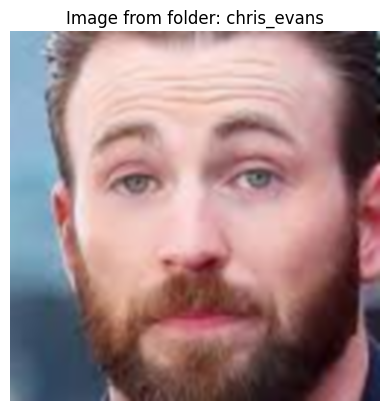

Image shape: (126, 126, 3) from folder: chris_evans


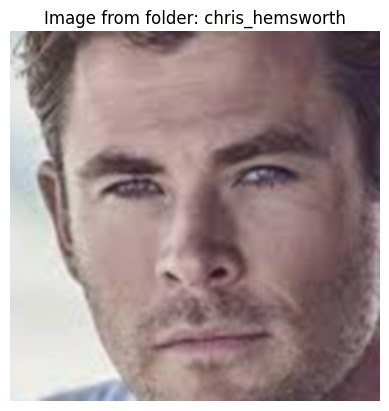

Image shape: (132, 132, 3) from folder: chris_hemsworth


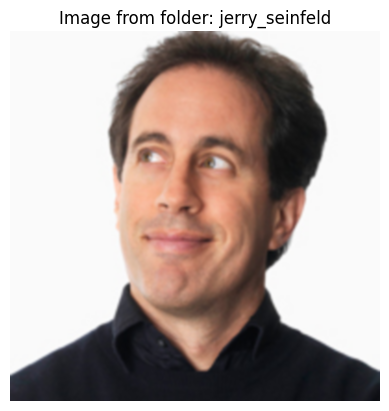

Image shape: (200, 200, 3) from folder: jerry_seinfeld


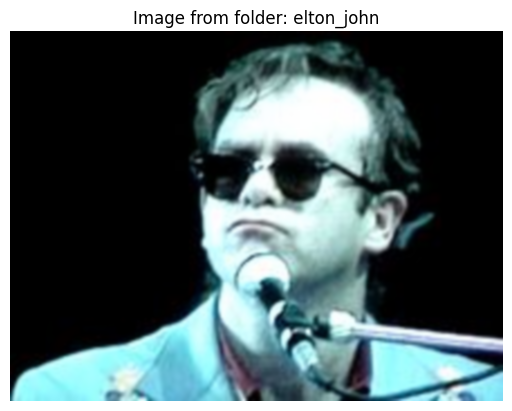

Image shape: (165, 220, 3) from folder: elton_john


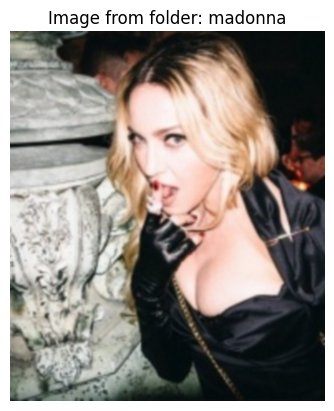

Image shape: (223, 190, 3) from folder: madonna


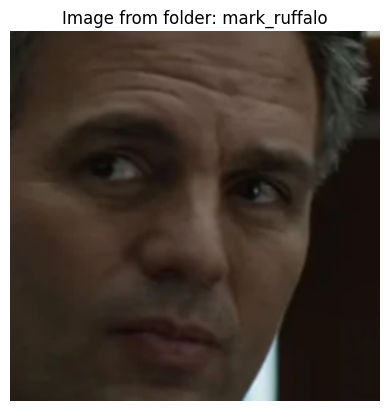

Image shape: (256, 256, 3) from folder: mark_ruffalo


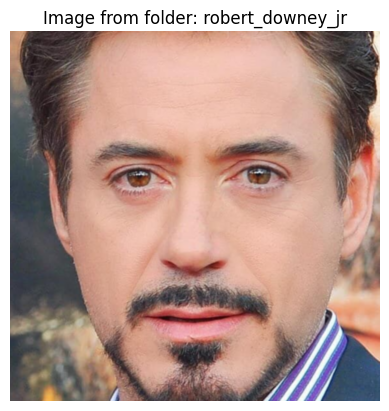

Image shape: (572, 572, 3) from folder: robert_downey_jr


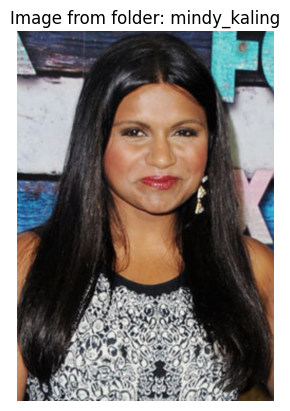

Image shape: (350, 243, 3) from folder: mindy_kaling


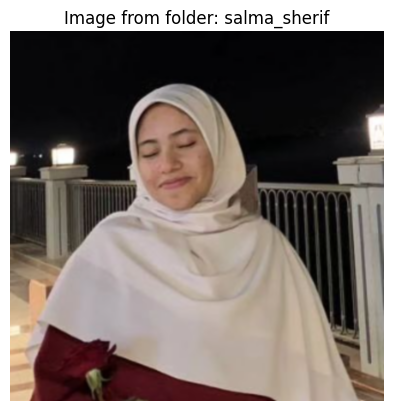

Image shape: (322, 325, 3) from folder: salma_sherif


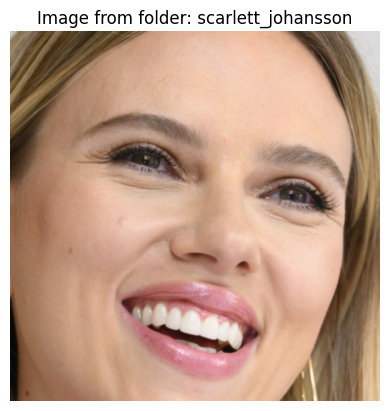

Image shape: (809, 809, 3) from folder: scarlett_johansson


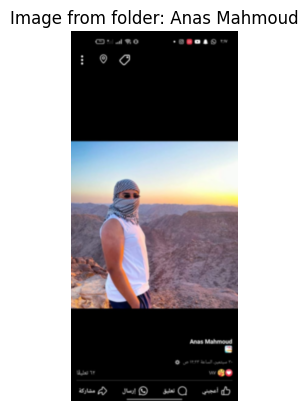

Image shape: (1200, 540, 3) from folder: Anas Mahmoud


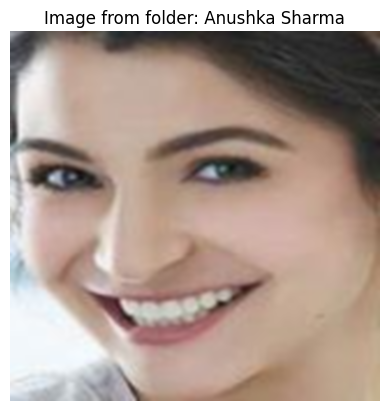

Image shape: (160, 160, 3) from folder: Anushka Sharma


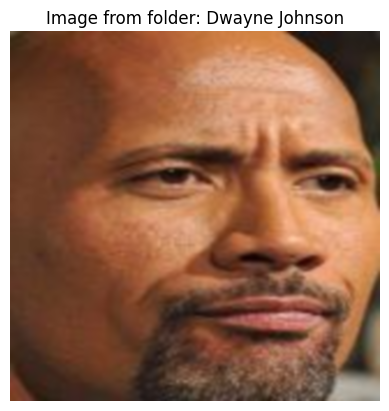

Image shape: (160, 160, 3) from folder: Dwayne Johnson


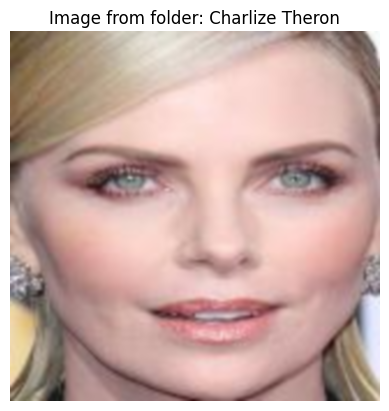

Image shape: (160, 160, 3) from folder: Charlize Theron


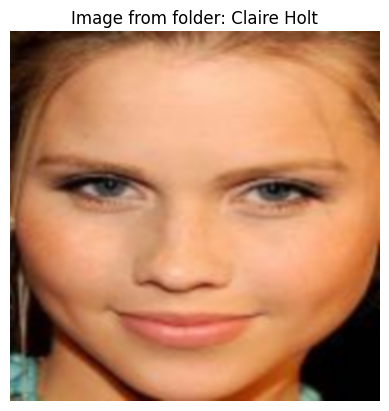

Image shape: (160, 160, 3) from folder: Claire Holt


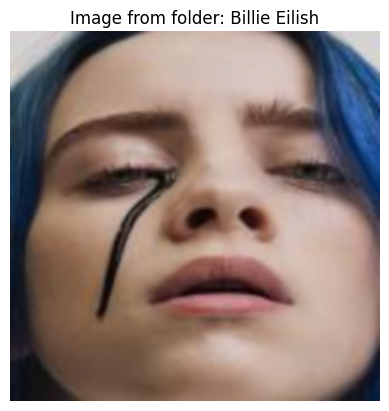

Image shape: (160, 160, 3) from folder: Billie Eilish


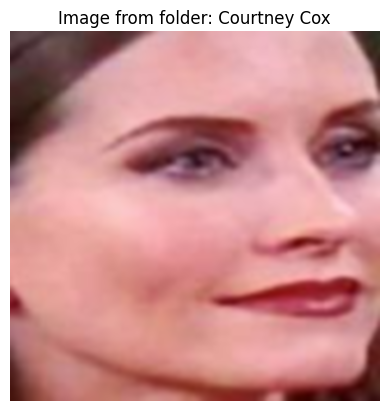

Image shape: (160, 160, 3) from folder: Courtney Cox


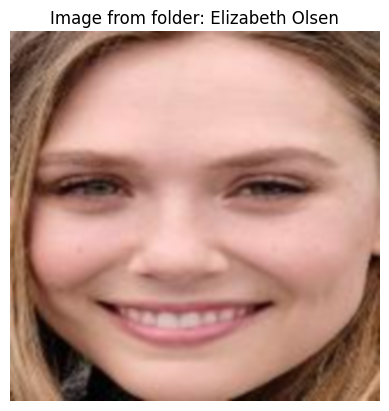

Image shape: (160, 160, 3) from folder: Elizabeth Olsen


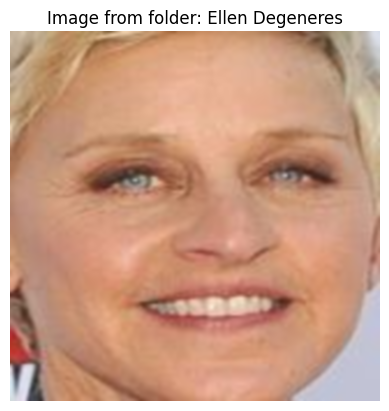

Image shape: (160, 160, 3) from folder: Ellen Degeneres


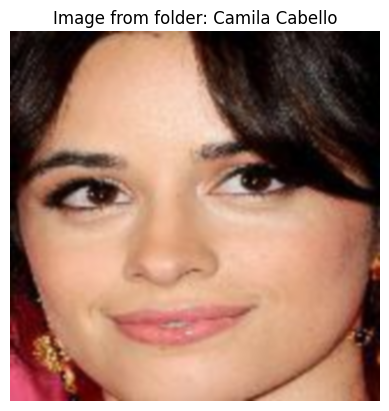

Image shape: (160, 160, 3) from folder: Camila Cabello


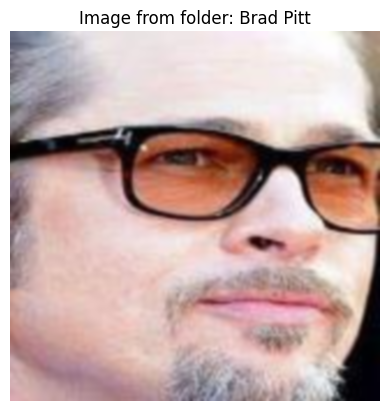

Image shape: (160, 160, 3) from folder: Brad Pitt


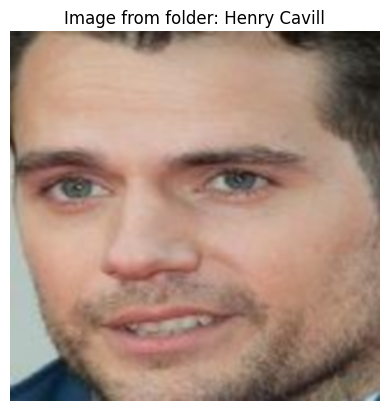

Image shape: (160, 160, 3) from folder: Henry Cavill


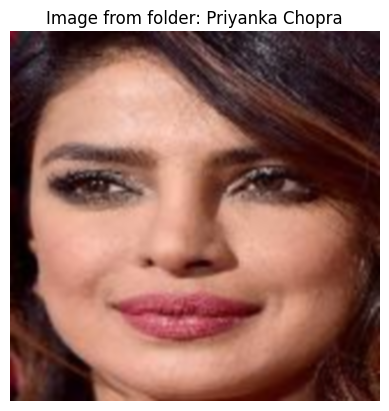

Image shape: (160, 160, 3) from folder: Priyanka Chopra


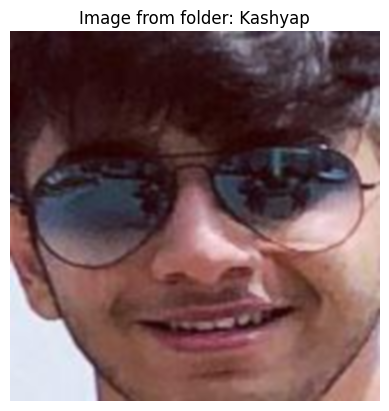

Image shape: (160, 160, 3) from folder: Kashyap


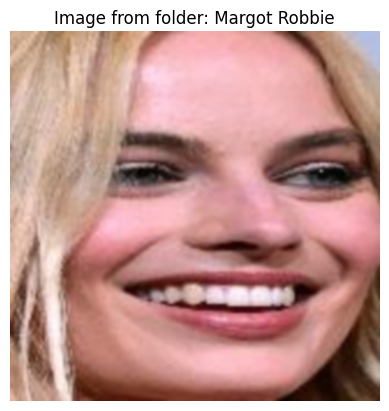

Image shape: (160, 160, 3) from folder: Margot Robbie


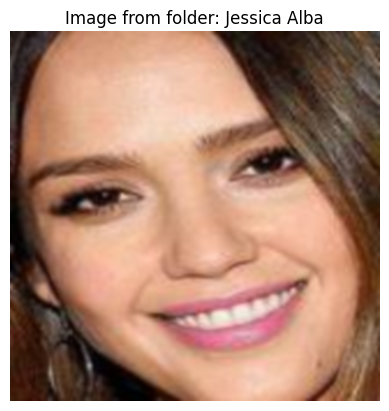

Image shape: (160, 160, 3) from folder: Jessica Alba


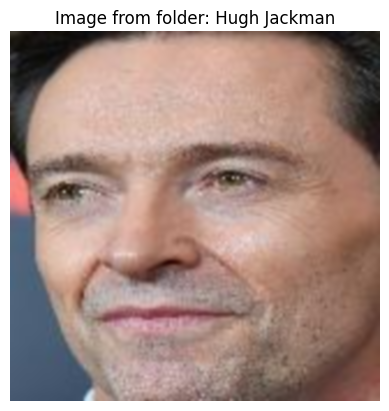

Image shape: (160, 160, 3) from folder: Hugh Jackman


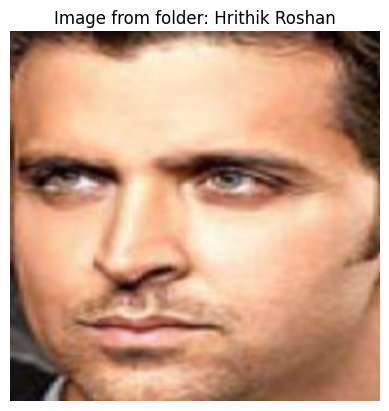

Image shape: (160, 160, 3) from folder: Hrithik Roshan


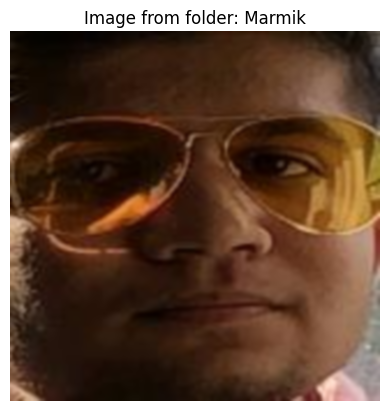

Image shape: (160, 160, 3) from folder: Marmik


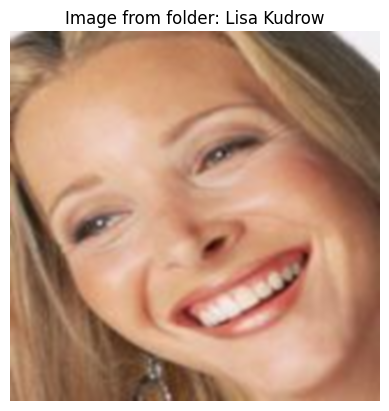

Image shape: (160, 160, 3) from folder: Lisa Kudrow


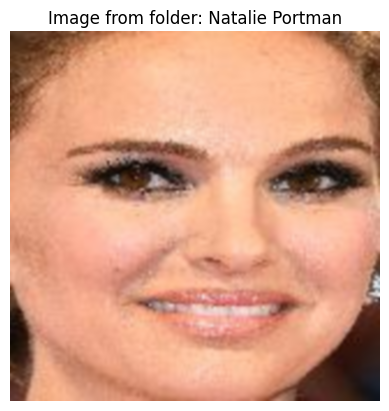

Image shape: (160, 160, 3) from folder: Natalie Portman


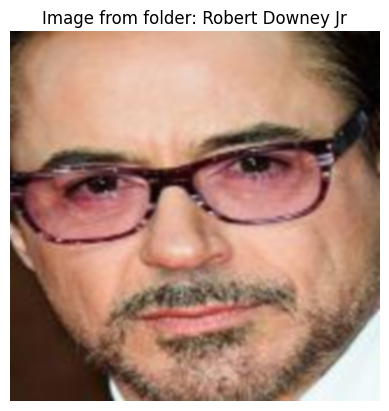

Image shape: (160, 160, 3) from folder: Robert Downey Jr


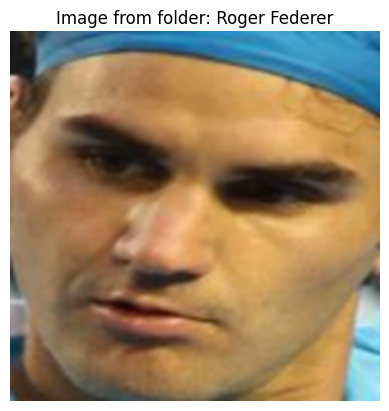

Image shape: (160, 160, 3) from folder: Roger Federer


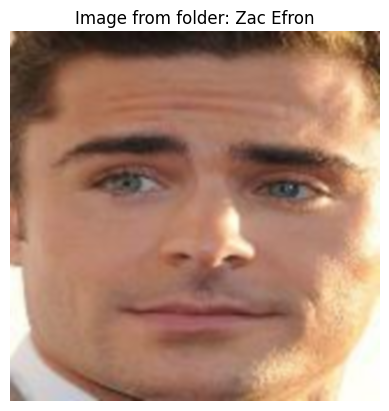

Image shape: (160, 160, 3) from folder: Zac Efron


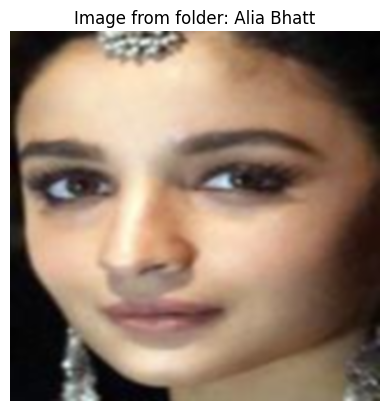

Image shape: (160, 160, 3) from folder: Alia Bhatt


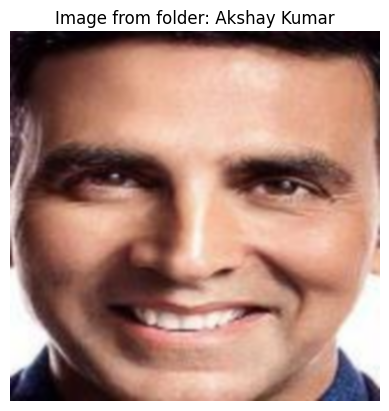

Image shape: (160, 160, 3) from folder: Akshay Kumar


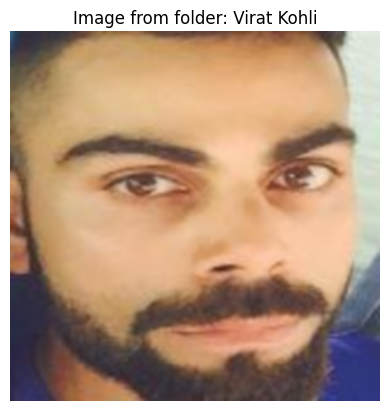

Image shape: (160, 160, 3) from folder: Virat Kohli


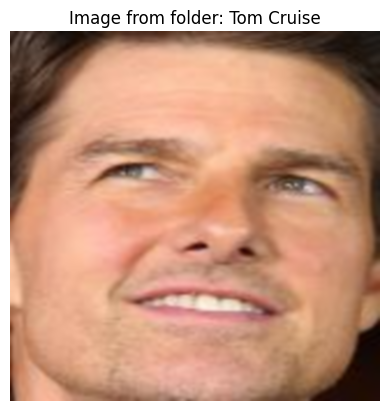

Image shape: (160, 160, 3) from folder: Tom Cruise


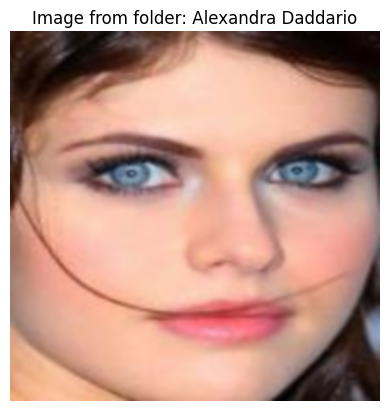

Image shape: (160, 160, 3) from folder: Alexandra Daddario


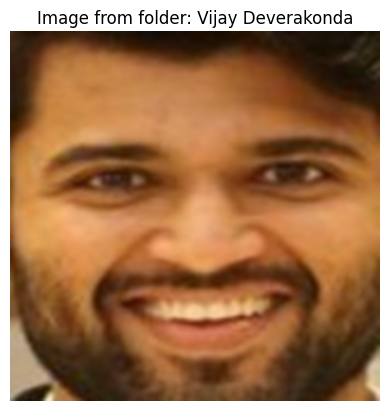

Image shape: (160, 160, 3) from folder: Vijay Deverakonda


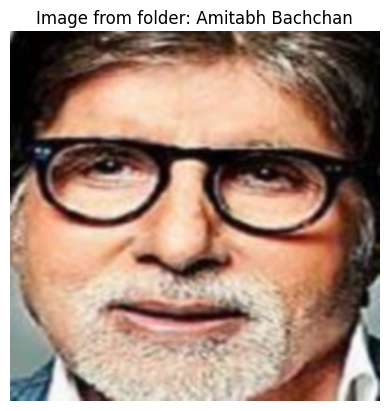

Image shape: (160, 160, 3) from folder: Amitabh Bachchan


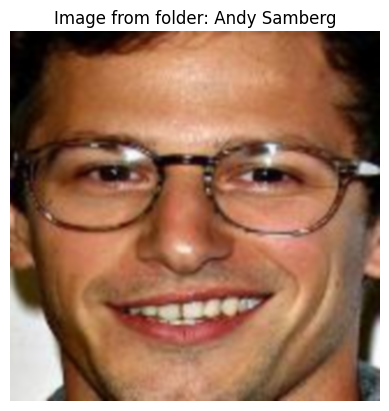

Image shape: (160, 160, 3) from folder: Andy Samberg


In [ ]:
base_dir = '/content/drive/Shareddrives/SIC/train'

for folder_name in os.listdir(base_dir):
    folder_path = os.path.join(base_dir, folder_name)

    if os.path.isdir(folder_path):
        image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg') or f.endswith('.jpeg') or f.endswith('.png')]

        if image_files:
            img_path = os.path.join(folder_path, image_files[0])
            img = cv2.imread(img_path)

            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            plt.imshow(img_rgb, cmap='gray', interpolation='bicubic')
            plt.title(f"Image from folder: {folder_name}")
            plt.axis('off')
            plt.show()

            print(f"Image shape: {img.shape} from folder: {folder_name}")


# Helper functions

In [ ]:
def extract_face(filename, required_size=(160, 160)):
    image = Image.open(filename)
    image = image.convert('RGB')
    pixels = np.asarray(image)
    detector = MTCNN()

    results = detector.detect_faces(pixels)
    if len(results) == 0:
        print("No faces detected in the image!")
        return None

    x1, y1, width, height = results[0]['box']
    x1, y1 = abs(x1), abs(y1)
    x2, y2 = x1 + width, y1 + height
    face = pixels[y1:y2, x1:x2]
    image = Image.fromarray(face)
    image = image.resize(required_size)
    face_array = np.asarray(image)
    return face_array

In [ ]:
def extract_face(filename, required_size=(160, 160)):
    image = Image.open(filename)
    image = image.convert('RGB')
    pixels = np.asarray(image)
    detector = MTCNN()

    # Detect faces in the image
    results = detector.detect_faces(pixels)
    if len(results) == 0:
        print(f"No faces detected in the image {filename}!")
        return None

    # Extract the bounding box coordinates for the first face found
    x1, y1, width, height = results[0]['box']
    x1, y1 = abs(x1), abs(y1)
    x2, y2 = x1 + width, y1 + height
    face = pixels[y1:y2, x1:x2]

    # Resize the extracted face to the required size
    image = Image.fromarray(face)
    image = image.resize(required_size)
    face_array = np.asarray(image)
    return face_array

In [ ]:
# Function to load faces from a directory
def load_face(dir):
    faces = []
    for filename in os.listdir(dir):
        path = os.path.join(dir, filename)
        face = extract_face(path)
        if face is not None:
            faces.append(face)
    return faces

In [ ]:
# Function to load a dataset from a directory with subdirectories for each class
def load_dataset(dir):
    X, y = [], []
    for subdir in os.listdir(dir):
        path = os.path.join(dir, subdir) + '/'
        faces = load_face(path)
        labels = [subdir for _ in range(len(faces))]
        print("Loaded %d samples for class: %s" % (len(faces), subdir))
        X.extend(faces)
        y.extend(labels)
    return np.asarray(X), np.asarray(y)

# Face Extraction

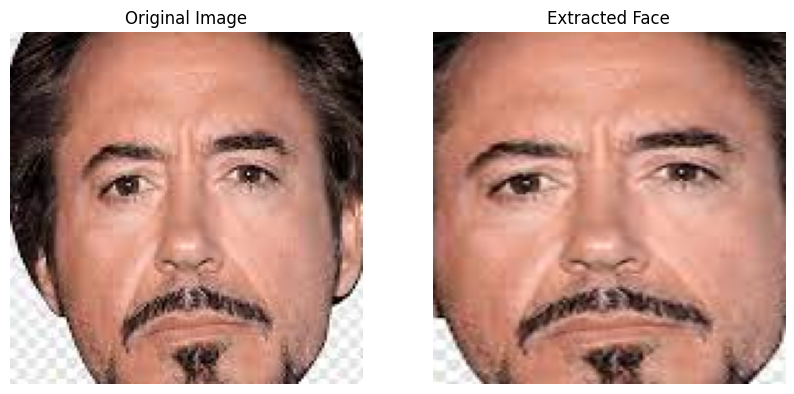

Extracted face shape: (160, 160, 3)


In [ ]:
image_path = '/content/drive/Shareddrives/SIC/train/robert_downey_jr/robert_downey_jr1.png'

original_image = Image.open(image_path)
pixels = extract_face(image_path)

if pixels is not None:
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(np.asarray(original_image))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(pixels)
    plt.title('Extracted Face')
    plt.axis('off')

    plt.show()
    print(f"Extracted face shape: {pixels.shape}")
else:
    print("No face was extracted.")

In [ ]:
trainX, trainy = load_dataset('/content/drive/Shareddrives/SIC/train')
print(f"Training data shape: {trainX.shape}, {trainy.shape}")

testX, testy = load_dataset('/content/drive/Shareddrives/SIC/val')
print(f"Test data shape: {testX.shape}, {testy.shape}")

np.savez_compressed('dataset.npz', trainX, trainy, testX, testy)

No faces detected in the image /content/drive/Shareddrives/SIC/train/chris_evans/chris_evans3.png!
Loaded 41 samples for class: chris_evans
Loaded 46 samples for class: chris_hemsworth
Loaded 21 samples for class: jerry_seinfeld
No faces detected in the image /content/drive/Shareddrives/SIC/train/elton_john/httpsuploadwikimediaorgwikipediacommonsthumbEltonJohninsjpgpxEltonJohninsjpg.jpg!
Loaded 16 samples for class: elton_john
Loaded 19 samples for class: madonna
Loaded 58 samples for class: mark_ruffalo
Loaded 40 samples for class: robert_downey_jr
Loaded 22 samples for class: mindy_kaling
Loaded 5 samples for class: salma_sherif
Loaded 36 samples for class: scarlett_johansson
No faces detected in the image /content/drive/Shareddrives/SIC/train/Anas Mahmoud/WhatsApp Image 2024-11-09 at 2.19.25 AM(3).jpeg!
Loaded 3 samples for class: Anas Mahmoud
Loaded 42 samples for class: Anushka Sharma
Loaded 42 samples for class: Dwayne Johnson
Loaded 42 samples for class: Charlize Theron
Loaded 4

# Modeling

In [ ]:
!wget -O /content/facenet-keras/facenet_keras.h5 <model-download-link>
!pip install keras-facenet

/bin/bash: -c: line 1: syntax error near unexpected token `newline'
/bin/bash: -c: line 1: `wget -O /content/facenet-keras/facenet_keras.h5 <model-download-link>'
  Preparing metadata (setup.py) ... done
  Created wheel for keras-facenet: filename=keras_facenet-0.3.2-py3-none-any.whl size=10368 sha256=feb90cf1b2ba93b7077569cd74f161179c0bd23ceb78a50b28559909872aa1fa
  Stored in directory: /root/.cache/pip/wheels/1d/d8/a9/85cf04ea29321d2afcb82c0caaafdca9195385f9d68cbc7185
Successfully built keras-facenet


In [ ]:
import h5py
try:
    with h5py.File('/content/facenet-keras/facenet_keras.h5', 'r') as f:
        print(f.keys())  # List the keys in the HDF5 file
except Exception as e:
    print("Error loading the model file:", e)

<KeysViewHDF5 ['model_weights']>


In [ ]:
from keras_facenet import FaceNet

embedder = FaceNet()
facenet_model = embedder.model
print(facenet_model.summary())  # Verify the model is loaded correctly

Model: "inception_resnet_v1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, None, None, 3)  │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv2d_1a_3x3 (Conv2D)    │ (None, None, None, 32) │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv2d_1a_3x3_BatchNorm   │ (None, None, None, 32) │             96 │ Conv2d_1a_3x3[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv2d_1a_3x3_Activation  │ (None, None, None, 32) │              0 │ Conv2d_1a_3x3_BatchNo… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv2d_2a_3x3 (Conv2D)    │ (None, None, None, 32) │          9,216 │ Conv2d_1a_3x3_Activat… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv2d_2a_3x3_BatchNorm   │ (None, None, None, 32) │             96 │ Conv2d_2a_3x3[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv2d_2a_3x3_Activation  │ (None, None, None, 32) │              0 │ Conv2d_2a_3x3_BatchNo… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv2d_2b_3x3 (Conv2D)    │ (None, None, None, 64) │         18,432 │ Conv2d_2a_3x3_Activat… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv2d_2b_3x3_BatchNorm   │ (None, None, None, 64) │            192 │ Conv2d_2b_3x3[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv2d_2b_3x3_Activation  │ (None, None, None, 64) │              0 │ Conv2d_2b_3x3_BatchNo… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ MaxPool_3a_3x3            │ (None, None, None, 64) │              0 │ Conv2d_2b_3x3_Activat… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv2d_3b_1x1 (Conv2D)    │ (None, None, None, 80) │          5,120 │ MaxPool_3a_3x3[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv2d_3b_1x1_BatchNorm   │ (None, None, None, 80) │            240 │ Conv2d_3b_1x1[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv2d_3b_1x1_Activation  │ (None, None, None, 80) │              0 │ Conv2d_3b_1x1_BatchNo… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv2d_4a_3x3 (Conv2D)    │ (None, None, None,     │        138,240 │ Conv2d_3b_1x1_Activat… │
│                      

 Total params: 23,497,424 (89.64 MB)

 Trainable params: 23,467,824 (89.52 MB)

 Non-trainable params: 29,600 (115.62 KB)

None


In [ ]:
def get_embedding(model, face):
    # scale pixel values
    face = face.astype('float32')

    # standardization
    mean, std = face.mean(), face.std()
    face = (face-mean)/std

    # transfer face into one sample (3 dimension to 4 dimension)
    sample = np.expand_dims(face, axis=0)

    # make prediction to get embedding
    yhat = model.predict(sample)
    return yhat[0]

# face train to embedding
emdTrainX = []
for face in trainX:
    emd = get_embedding(facenet_model, face)
    emdTrainX.append(emd)

emdTrainX = np.asarray(emdTrainX)
print(emdTrainX.shape)

# face test to embedding
emdTestX = list()
for face in testX:
    emd = get_embedding(facenet_model, face)
    emdTestX.append(emd)
emdTestX = np.asarray(emdTestX)
print(emdTestX.shape)

# save arrays to one file in compressed format
np.savez_compressed('embeddings.npz', emdTrainX, trainy, emdTestX, testy)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

In [18]:
import numpy as np
from sklearn.preprocessing import Normalizer, LabelEncoder
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

# Sample Data
# Let's assume emdTrainX, emdTestX, trainy, testy are already defined

# Normalize input vectors
in_encoder = Normalizer()
emdTrainX_norm = in_encoder.transform(emdTrainX)
emdTestX_norm = in_encoder.transform(emdTestX)

# Label encode targets
all_labels = np.unique(np.concatenate((trainy, testy)))  # Combine and find all unique labels
out_encoder = LabelEncoder()
out_encoder.fit(all_labels)  # Fit on all unique labels from both train and test sets

trainy_enc = out_encoder.transform(trainy)
testy_enc = out_encoder.transform(testy)

# Fit model
model = SVC(kernel='linear', probability=True)
model.fit(emdTrainX_norm, trainy_enc)

# Predict
yhat_train = model.predict(emdTrainX_norm)
yhat_test = model.predict(emdTestX_norm)

# Score
score_train = accuracy_score(trainy_enc, yhat_train)
score_test = accuracy_score(testy_enc, yhat_test)

# Summarize
print('Accuracy: train=%.3f, test=%.3f' % (score_train * 100, score_test * 100))


Accuracy: train=99.301, test=95.563


Predicted: 
['Akshay Kumar' 'Alexandra Daddario' 'Alia Bhatt' 'Amitabh Bachchan'
 'Anas Mahmoud'] 
[ 1.35629187  1.22115958  0.57009532  0.56741364  3.7362774   1.6414258
  0.42546109  1.06744323  1.13266643  1.38971984  0.65758886  1.7598093
  0.27686248  1.60800314  0.90152911  0.44342074  1.09049151  0.9456154
  0.78109898  0.95491759 42.57569401  0.41757637  0.9710518  10.76387346
  0.73129011  1.13161022  1.50073351  0.98566863  1.82050065  2.89344697
  1.08250186  0.66877008  0.30515251  0.33803764  1.91131542  0.44211425
  0.59219181  0.9454608   2.11281066  2.38810149  1.20348166  1.69132476]
Expected: Kashyap
Kashyap: 42.58%
Marmik: 10.76%
Anas Mahmoud: 3.74%
Vijay Deverakonda: 2.89%
mindy_kaling: 2.39%
mark_ruffalo: 2.11%
chris_hemsworth: 1.91%
Tom Cruise: 1.82%
Claire Holt: 1.76%
salma_sherif: 1.69%
Andy Samberg: 1.64%
Dwayne Johnson: 1.61%
Robert Downey Jr: 1.50%
Camila Cabello: 1.39%
Akshay Kumar: 1.36%
Alexandra Daddario: 1.22%
robert_downey_jr: 1.20%
Brad Pitt: 1.13%
Pri

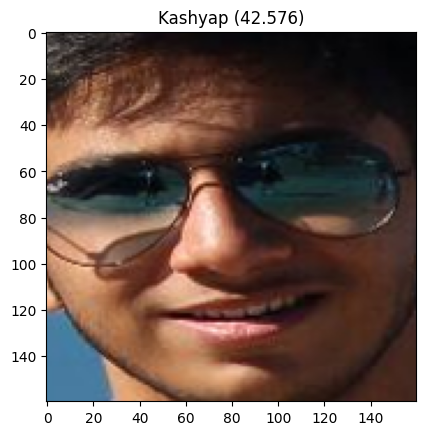

In [19]:
# Select a random face from test set
selection = choice([i for i in range(testX.shape[0])])
random_face = testX[selection]
random_face_emd = emdTestX_norm[selection]
random_face_class = testy_enc[selection]
random_face_name = out_encoder.inverse_transform([random_face_class])

# Prediction for the face
samples = np.expand_dims(random_face_emd, axis=0)
yhat_class = model.predict(samples)
yhat_prob = model.predict_proba(samples)

# Get name of the predicted class
class_index = yhat_class[0]
class_probability = yhat_prob[0, class_index] * 100
predict_names = out_encoder.inverse_transform(yhat_class)

# List all classes and their corresponding probabilities
all_class_probabilities = zip(out_encoder.inverse_transform(range(len(out_encoder.classes_))), yhat_prob[0])

# Sort classes by probability
sorted_class_probabilities = sorted(all_class_probabilities, key=lambda x: x[1], reverse=True)

# predicted class and probabilities
print('Predicted: \n%s \n%s' % (out_encoder.inverse_transform([0, 1, 2, 3, 4]), yhat_prob[0] * 100))
print('Expected: %s' % random_face_name[0])

# class probabilities
for name, prob in sorted_class_probabilities:
    print(f'{name}: {prob * 100:.2f}%')

# Validate prediction
if predict_names[0] == random_face_name[0]:
    print(f'Prediction is correct: {predict_names[0]}')
else:
    print(f'Prediction is incorrect. Expected: {random_face_name[0]}, Predicted: {predict_names[0]}')

plt.imshow(random_face)
title = '%s (%.3f)' % (predict_names[0], class_probability)
plt.title(title)
plt.show()

In [20]:
joblib.dump(model, '/content/facenet_svc_model.pkl')
joblib.dump(out_encoder, '/content/facenet_label_encoder.pkl')

print("Model and label /encoder saved successfully!")

Model and label /encoder saved successfully!


In [21]:
!pip install pyngrok

In [74]:
import os
import socket
import cv2
import numpy as np
import joblib
import pandas as pd
from flask import Flask, request, render_template_string, send_from_directory, redirect, url_for, send_file
from werkzeug.utils import secure_filename
from keras_facenet import FaceNet
from datetime import datetime
from mtcnn.mtcnn import MTCNN
from pyngrok import ngrok

# Initialize Flask app
app = Flask(__name__)
app.config['MAX_CONTENT_LENGTH'] = 16 * 1024 * 1024  # 16MB max file size
app.config['UPLOAD_FOLDER'] = 'temp_uploads'
app.config['DOWNLOAD_FOLDER'] = 'downloads'
app.config['ALLOWED_EXTENSIONS'] = {'mp4', 'avi', 'mov', 'mkv'}

# Ensure upload and download folders exist
os.makedirs(app.config['UPLOAD_FOLDER'], exist_ok=True)
os.makedirs(app.config['DOWNLOAD_FOLDER'], exist_ok=True)

# Initialize FaceNet and MTCNN
embedder = FaceNet()
detector = MTCNN()

# Load the saved models
model = joblib.load('facenet_svc_model.pkl')
label_encoder = joblib.load('facenet_label_encoder.pkl')

# Set up ngrok (Ensure you have pyngrok installed and replace the auth token if necessary)
ngrok.set_auth_token('2fsJOfECrU5047Dx6yFHRoGNKFf_2QJgtV1GhxZ64g8gRzX3')  # Replace with your actual token
def allowed_file(filename):
    """Check if the uploaded file has an allowed extension."""
    return '.' in filename and \
           filename.rsplit('.', 1)[1].lower() in app.config['ALLOWED_EXTENSIONS']

def get_embedding(face_pixels):
    """Get the face embedding for given face pixels"""
    face_pixels = face_pixels.astype('float32')
    mean, std = face_pixels.mean(), face_pixels.std()
    face_pixels = (face_pixels - mean) / std
    samples = np.expand_dims(face_pixels, axis=0)
    yhat = embedder.model.predict(samples)
    return yhat[0]

def process_frame(frame):
    """Process a single frame for face recognition."""
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    faces = detector.detect_faces(rgb_frame)
    recognized_people = []

    for face in faces:
        if face['confidence'] > 0.95:
            x, y, width, height = face['box']
            # Ensure coordinates are within frame boundaries
            x, y = max(0, x), max(0, y)
            face_pixels = rgb_frame[y:y+height, x:x+width]
            if face_pixels.size == 0:
                continue
            face_pixels = cv2.resize(face_pixels, (160, 160))
            face_embedding = get_embedding(face_pixels)
            face_embedding = face_embedding.reshape(1, -1)
            yhat_class = model.predict(face_embedding)
            person_name = label_encoder.inverse_transform(yhat_class)[0]
            recognized_people.append(person_name)

    return recognized_people

def process_video(video_path):
    """Process the uploaded video and return recognized people."""
    cap = cv2.VideoCapture(video_path)
    frames_processed = 0
    all_recognized_faces = []
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_interval = 10  # Process every 10th frame

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        if frames_processed % frame_interval == 0:
            recognized_faces = process_frame(frame)
            all_recognized_faces.extend(recognized_faces)
        frames_processed += 1
    cap.release()

    face_counts = {name: all_recognized_faces.count(name) for name in set(all_recognized_faces)}
    threshold = max(3, int(frames_processed * 0.1 // frame_interval))
    final_results = {name: count for name, count in face_counts.items() if count > threshold}
    return list(final_results.keys())

HTML_TEMPLATE = '''<!DOCTYPE html>
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <title>Face Recognition Attendance System</title>
    <link href="https://cdn.jsdelivr.net/npm/bootstrap@5.1.3/dist/css/bootstrap.min.css" rel="stylesheet">
    <style>
        body {
            /* Set background image using the Flask route */
            background-image: url("{{ url_for('background_image') }}");
            background-size: cover;
            background-repeat: no-repeat;
            background-position: center;
            background-attachment: fixed;
        }
        .container {
            max-width: 700px;
            margin-top: 50px;
            background-color: rgba(255, 255, 255, 0.9); /* Semi-transparent white background */
            padding: 30px;
            border-radius: 5px;
        }
        .header {
            background-color: #343a40;
            color: white;
            padding: 20px;
            border-radius: 5px;
            text-align: center;
            margin-bottom: 30px;
        }
        .alert {
            margin-top: 20px;
        }
        .download-btn {
            margin-top: 15px;
        }
    </style>
</head>
<body>
    <div class="container">
        <div class="header">
            <h1>Face Recognition Attendance System</h1>
        </div>
        <form method="POST" enctype="multipart/form-data">
            <div class="mb-3">
                <label for="videoFile" class="form-label">Upload a Video</label>
                <input class="form-control" type="file" id="videoFile" name="video" accept="video/*" required>
            </div>
            <button type="submit" class="btn btn-primary w-100">Process Video</button>
        </form>
        {% if results %}
        <div class="alert alert-success mt-4" role="alert">
            <h4 class="alert-heading">Attendance Results:</h4>
            <p>Processed at: {{ timestamp }}</p>
            <hr>
            <p class="mb-0">
                {% for person in results %}
                {{ loop.index }}. {{ person }} - Present<br>
                {% endfor %}
            </p>
            <a href="{{ url_for('download_file', filename=excel_filename) }}" class="btn btn-success download-btn">Download Excel Sheet</a>
        </div>
        {% elif error %}
        <div class="alert alert-danger mt-4" role="alert">
            {{ error }}
        </div>
        {% endif %}
    </div>
</body>
</html>'''

@app.route('/', methods=['GET', 'POST'])
def index():
    if request.method == 'POST':
        video_file = request.files.get('video')
        if video_file and video_file.filename:
            if allowed_file(video_file.filename):
                filename = secure_filename(video_file.filename)
                video_path = os.path.join(app.config['UPLOAD_FOLDER'], filename)
                video_file.save(video_path)
                try:
                    recognized_people = process_video(video_path)
                except Exception as e:
                    os.remove(video_path)
                    return render_template_string(HTML_TEMPLATE, error=f'Error processing video: {str(e)}', results=None)
                os.remove(video_path)
                if recognized_people:
                    # Create attendance DataFrame
                    attendance_data = {
                        'Person Name': recognized_people,
                        'Attendance': ['Present'] * len(recognized_people)
                    }
                    df = pd.DataFrame(attendance_data)
                    # Remove duplicates and keep first occurrence
                    df = df.drop_duplicates(subset=['Person Name'])
                    # Generate unique Excel filename
                    timestamp_str = datetime.now().strftime("%Y%m%d%H%M%S")
                    excel_filename = f'attendance_{timestamp_str}.xlsx'
                    excel_path = os.path.join(app.config['DOWNLOAD_FOLDER'], excel_filename)
                    # Save to Excel
                    df.to_excel(excel_path, index=False)
                    return render_template_string(
                        HTML_TEMPLATE,
                        results=recognized_people,
                        timestamp=datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
                        excel_filename=excel_filename,
                        error=None
                    )
                else:
                    return render_template_string(HTML_TEMPLATE, error='No recognizable faces found in the video.', results=None)
            else:
                return render_template_string(HTML_TEMPLATE, error='Unsupported file type. Please upload a valid video file.', results=None)
        else:
            return render_template_string(HTML_TEMPLATE, error='No video file uploaded or selected.', results=None)
    return render_template_string(HTML_TEMPLATE, results=None, error=None)

@app.route('/download/<filename>')
def download_file(filename):
    """Route to download the generated Excel file."""
    return send_from_directory(app.config['DOWNLOAD_FOLDER'], filename, as_attachment=True)

@app.route("/background_image")
def background_image():
    """Route to serve the background image."""
    # Update the image path as per your environment
    image_path = "/content/51713248807_584698fcd9_b.jpg"  # Replace with your image path
    if os.path.exists(image_path):
        return send_file(image_path, mimetype='image/jpeg')
    else:
        return "Background image not found.", 404

def get_open_port():
    """Find an open port to run the Flask app."""
    sock = socket.socket(socket.AF_INET, socket.SOCK_STREAM)
    sock.bind(("", 0))
    port = sock.getsockname()[1]
    sock.close()
    return port

if __name__ == "__main__":
    port = get_open_port()
    ngrok_tunnel = ngrok.connect(port)
    print('NGROK Tunnel URL:', ngrok_tunnel.public_url)
    app.run(port=port)


NGROK Tunnel URL: https://dbf5-34-125-73-143.ngrok-free.app
 * Serving Flask app '__main__'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:45393
INFO:werkzeug:Press CTRL+C to quit
